<h1 align="center">Problem 2 - Practical HBM</h1>
<h2 align="center">One- and Two-Component Gaussian Mixture Hierarchcial Bayesian Modeling with PyJAGS</h2>
<h3 align="center">Simulating the eccentricity distribution of hot Jupiter exoplanets from the Kepler Mission</h3> 
<h4 align="center">LSSTC DSFP Session 4, September 21st, 2017</h4>
<h5 align="center">Author: Megan I. Shabram, PhD, 
NASA Postdoctoral Program Fellow,  mshabram@gmail.com</h5>


1. Use the code below to explore a two-component Gaussian mixture model
2. Using the simulated data code cells below, evaluate the one-component truncated Gaussian generative model simualted data with the two-component Gaussian mixture HBM. What do you notice about the posteriors for the mixture fractions? 
3. Repeat this exersize but now evaluating simulated data from a one-component generative model with a two-component HBM. 
4. Notebook 3: Using the JAGS model code block for a break-point HBM, set up and evaluate the break-point HBM on the real Kepler eclipsing binary data set provided (some code is provided for analysis).  



In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import pyjags
import pickle

from __future__ import division, print_function
from pandas.tools.plotting import *
from matplotlib import rcParams
rcParams["savefig.dpi"] = 100
rcParams["font.size"] = 20
#plt.style.use('ggplot')

%matplotlib inline
%config InlineBackend.figure_format = 'retina'
#%qtconsole


<h3 align="left"> 1. Generate simulated data set: one- and two-component truncated Gaussian mixture generative models:</h3>


In [2]:
## function to draw from truncated normal, this function will be used for both the 
## one- and two-componenet cases in this workbook.  

def rnorm_bound( Ndata, mu, prec, lower_bound = 0.0, upper_bound = float('Inf')):
    x = np.zeros(Ndata)
    #print(x)
    for i in range(0, Ndata): 
            #print(i)
            while True:
                x[i] = np.random.normal(mu,prec,1)
                if( (x[i]>lower_bound) and (x[i]<upper_bound) ): 
                    break
    return x;

In [3]:
## Check the output to make sure the function is outputting as expected. 
#print(np.random.normal(0,0.0001,10))
print(rnorm_bound(10, 0.0, 0.001, lower_bound=-1,upper_bound=1))

[  7.27881049e-05  -2.18943973e-03  -1.08032015e-03  -7.09670642e-04
  -9.85663193e-04   5.33832029e-04  -1.28068054e-03   8.55453216e-04
  -9.55376008e-05  -2.92160783e-04]


[ 0.15646913 -0.06293796  0.17921062  0.02016463  0.00624744 -0.44193826
  0.26401926 -0.11224319 -0.51290789 -0.05186945 -0.11331983 -0.32968955
 -0.85791496  0.15759276 -0.09196239  0.08683291  0.12788464  0.26696421
 -0.28996685 -0.51374236  0.20367613  0.20445186  0.20805655  0.15616392
  0.23264559] [ 0.12755181 -0.01687982  0.16029573 -0.02238011  0.07386165 -0.42367829
  0.23170749 -0.1225211  -0.53586809 -0.02806623 -0.14538653 -0.35723926
 -0.79465207  0.14562359 -0.11430394  0.11096191  0.14003731  0.24172567
 -0.27408329 -0.56138657  0.17159121  0.23120098  0.27033367  0.17338803
  0.23849413] [ 0.05016703 -0.32801134  0.02022949 -0.04232315 -0.15882408  0.09666296
 -0.05655188  0.07873181 -0.09232432 -0.13675894 -0.16064405  0.17637188
 -0.01340021 -0.46351096  0.55537365  0.13836734  0.30540795 -0.31655411
  0.13275002 -0.10244601  0.05181763 -0.28442512 -0.19233378 -0.17079813
  0.52804954] [ 0.00764899 -0.35054264 -0.02321937 -0.11567939 -0.16847681  0.06725334
 -0.07102

(array([ 1.,  0.,  2.,  1.,  2.,  0.,  3.,  3.,  6.,  7.]),
 array([-0.79465207, -0.6881535 , -0.58165492, -0.47515635, -0.36865777,
        -0.2621592 , -0.15566063, -0.04916205,  0.05733652,  0.1638351 ,
         0.27033367]),
 <a list of 10 Patch objects>)

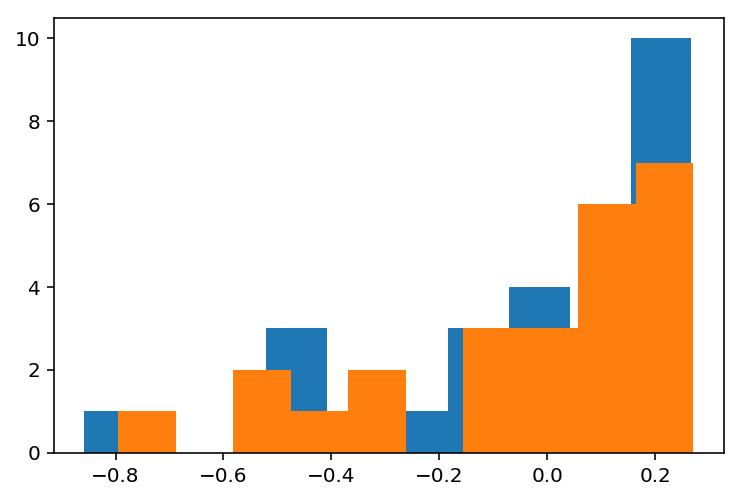

In [4]:
## One-component Gaussian Mixture Simulated Data for both projected eccentricity terms
## Below we designate the population values of our generative model. These are the 
## truths that we should recover if our hiararchical Bayesian model is properly specified 
## and diagnostics have indicated that the simulation has "not not converged". "You can't 
## prove convergence, at best you can fail to prove a failure to converge".

## In this simulated data set, their are 25 planetary systems (with one planet each)
Ndata = 25 
## Here we asign the dispersion of the simulated population to be 0.3, this is 
## the truth we wish to recovern 
sigmae = 0.3 
## We approximate the uncertainty for each measurement as normally distributed about a 
## reporte measurement point estimate.  
## For the eccentricity distribution for Hot Jupiters, the physical models used to derive 
## these produce larger uncertainty in k by a factor of 2. 
sigmahobs = 0.04
sigmakobs = 0.08

h = np.repeat(0.,Ndata)
k = np.repeat(0.,Ndata)
hhat = np.repeat(0.,Ndata)
khat = np.repeat(0.,Ndata)
hhat_sigma  = np.repeat(sigmahobs,Ndata)
khat_sigma  = np.repeat(sigmakobs,Ndata)

#print(khat_sigma)


for i in range(0,Ndata):
    h[i] = rnorm_bound(1,0,sigmae,lower_bound=-1,upper_bound=1)
    lb = -np.sqrt(1-h[i]**2)
    ub = np.sqrt(1-h[i]**2)
    k[i] = rnorm_bound(1,0,sigmae,lower_bound=lb,upper_bound=ub) 
    hhat[i] = rnorm_bound(1,h[i],sigmahobs,lower_bound=-1,upper_bound=1)
    khat[i] = rnorm_bound(1,k[i],sigmakobs,lower_bound=lb,upper_bound=ub)

## Vizualize the true data values, and the simulated measurements:     
print(h, hhat, k, khat)
plt.hist(h)
plt.hist(hhat)

In [23]:
## JAGS user manual: 
## http://www.uvm.edu/~bbeckage/Teaching/DataAnalysis/Manuals/manual.jags.pdf

## JAGS model code

## model code is the one-component truncated gaussian mixture HBM code from previous 
## notebook


code1 = '''

model {
        
    #Population parameters
    e_sigma ~ dunif(0.0, 1.0)
    e_phi <- 1/(e_sigma*e_sigma)
        
    for (n in 1:Ndata){
    
        #True planet properties
        h[n] ~ dnorm(0, e_phi) T(-1,1) #Can try multivariate truncated normal in future
        k[n] ~ dnorm(0, e_phi) T(-sqrt(1-h[n]*h[n]),sqrt(1-h[n]*h[n]))
            
        #Observed planet properties
        hhat[n] ~ dnorm(h[n], 1.0/(hhat_sigma[n]*hhat_sigma[n])) T(-1,1)
        khat[n] ~ dnorm(k[n], 1.0/(khat_sigma[n]*khat_sigma[n])) T(-sqrt(1-hhat[n]*hhat[n]),sqrt(1-hhat[n]*hhat[n]))
    }
        
}
'''

In [24]:
## Load additional JAGS module
pyjags.load_module('glm')
pyjags.load_module('dic')


## See blog post for origination of the adapted analysis tools used here and below:
## https://martynplummer.wordpress.com/2016/01/11/pyjags/

num_chains = 4
iterations = 10000


## data list include only variables in the model
model = pyjags.Model(code1, data=dict( Ndata=Ndata, hhat=hhat, khat=khat, 
                                     hhat_sigma=hhat_sigma, khat_sigma=khat_sigma), 
                     chains=num_chains, adapt=1000)

## Code to speed up compute time. This feature might not be 
## well tested in pyjags at this time. 
## threads=4, chains_per_thread=1 

## 500 warmup / burn-in iterations, not used for inference.
model.sample(500, vars=[])

## Run model for desired steps, monitoring hyperparameter variables, and latent variables
## for hierarchical Bayesian model.
## Returns a dictionary with numpy array for each monitored variable.
## Shapes of returned arrays are (... shape of variable ..., iterations, chains).
## samples = model.sample(#iterations per chain here, vars=['e_sigma', 'h', 'k'])
samples = model.sample(iterations, vars=['e_sigma', 'h', 'k'])

## Code to save, open and use pickled dictionary of samples:
## -- Pickle the data --
#with open('ecc_1_test.pkl', 'wb') as handle:
#   pickle.dump(samples, handle)
## -- Retrieve pickled data --
#with open('ecc_1_test.pkl', 'rb') as handle:
#   retrieved_results = pickle.load(handle)


adapting: iterations 4000 of 4000, elapsed 0:00:02, remaining 0:00:00
sampling: iterations 2000 of 2000, elapsed 0:00:01, remaining 0:00:00
sampling: iterations 17196 of 40000, elapsed 0:00:09, remaining 0:00:12
sampling: iterations 26844 of 40000, elapsed 0:00:14, remaining 0:00:07
sampling: iterations 40000 of 40000, elapsed 0:00:21, remaining 0:00:00
sampling: iterations 40000 of 40000, elapsed 0:00:21, remaining 0:00:00


In [25]:
## Generalize code for both h and k below. 

#print(samples)
#print(samples.items())

## Print and check the shape of the resultant samples dictionary:
print(samples['e_sigma'].shape)
print(samples['e_sigma'].squeeze(0).shape)
print(samples['h'].shape)
print(samples['k'][0,:,:].shape)
print('-----')


## Update the samples dictionary so that it includes keys for the latent variables
## Also, we will use LaTeX formatting to help make legible plots ahead.  
samples_Nm1 = {}

## adjust the thin varible to only look at every 10th population element by setting it to 10
thin = 1
## Need to enter the number of hyperparameter variables here:
numHyperParams = 1
## Specify the dimension we want for our plot below, for legibility.  
dim = (Ndata/thin)*2 + numHyperParams
print(dim)

for i in np.arange(0,Ndata,thin):
    #hval = 'h'+str(i+1)
    #kval = 'k'+str(i+1)
    #print(hval)
    #print(kval)
    #samples_Nm1({hval: samples['h'][i,:,:]})
    samples_Nm1.update({'$h_{'+str(i+1)+'}$': samples['h'][i,:,:], '$k_{'+str(i+1)+'}$': samples['k'][i,:,:]})
#print(samples_2['h11'].shape)

## Add the hyperparameter marginal posterior back in:
samples_Nm1.update({'$e_{\sigma}$': samples['e_sigma'].squeeze(0)})

## Below, examine the updated and reformatted sample dictionary to include keys for 
## latent variables 
for j, i in samples_Nm1.items():
    print(j)
    print(i)
samples_Nm1['$h_{5}$'][0]

(1, 10000, 4)
(10000, 4)
(25, 10000, 4)
(10000, 4)
-----
51.0
$h_{2}$
[[-0.08212658 -0.03922966 -0.10075406 -0.11302079]
 [-0.05241275 -0.1076364  -0.08446677 -0.07133963]
 [-0.03802743 -0.0580854  -0.07822196 -0.08546572]
 ..., 
 [-0.11183785 -0.07644395 -0.11563582 -0.10616297]
 [-0.0843258  -0.12639729 -0.04810116 -0.05975788]
 [-0.08027704 -0.09864931 -0.03476747 -0.06014056]]
$k_{6}$
[[ 0.00434339  0.03513934 -0.07177358 -0.12911069]
 [ 0.10034379 -0.01055201 -0.07791041 -0.13357048]
 [ 0.03410744 -0.03613519 -0.04402348 -0.03465565]
 ..., 
 [-0.02230273 -0.0751738   0.13269512 -0.03579454]
 [-0.04714634  0.01916362  0.1430841   0.02988078]
 [ 0.00861979  0.04104303  0.11282789  0.05096867]]
$k_{17}$
[[ 0.15348039  0.05132422  0.07793794  0.17269672]
 [ 0.24567724  0.140827    0.11369228  0.09804781]
 [ 0.2396742   0.13440879  0.04210533  0.09624419]
 ..., 
 [ 0.04590132  0.13647661  0.16121646  0.04252956]
 [ 0.20218811  0.21565468  0.13264911  0.08939529]
 [ 0.2310254   0.174328

array([ 0.08723731,  0.1242694 ,  0.05722645,  0.10903348])

<div>  <p>Below is code to look at <b>summary statistics</b> of <b>the marginal posterior distributions</b>  (the probabilistic parameter estimates) 
for the hyperparameter and the latent variables 
(each population constituent), in this case <i>h</i> and <i>k</i> (a.k.a projected eccentricity here), of the exoplanet systems we are simulating). </p> </div>

In [26]:
## equal tailed 95% credible intervals, and posterior distribution means:
def summary(samples, varname, p=95):
    values = samples[varname][0]
    ci = np.percentile(values, [100-p, p])
    print('{:<6} mean = {:>5.1f}, {}% credible interval [{:>4.1f} {:>4.1f}]'.format(
      varname, np.mean(values), p, *ci))

for varname in samples_Nm1:
    summary(samples_Nm1, varname)


$h_{2}$ mean =  -0.1, 95% credible interval [-0.1 -0.0]
$k_{6}$ mean =  -0.0, 95% credible interval [-0.1  0.0]
$k_{17}$ mean =   0.1, 95% credible interval [ 0.1  0.2]
$h_{3}$ mean =  -0.3, 95% credible interval [-0.4 -0.2]
$h_{14}$ mean =  -0.1, 95% credible interval [-0.2 -0.1]
$k_{16}$ mean =  -0.1, 95% credible interval [-0.2 -0.1]
$k_{14}$ mean =  -0.1, 95% credible interval [-0.3  0.0]
$h_{15}$ mean =   0.5, 95% credible interval [ 0.4  0.5]
$h_{17}$ mean =   0.5, 95% credible interval [ 0.5  0.6]
$h_{5}$ mean =   0.1, 95% credible interval [ 0.1  0.1]
$k_{24}$ mean =  -0.0, 95% credible interval [-0.1  0.0]
$h_{18}$ mean =  -0.0, 95% credible interval [-0.1  0.1]
$h_{19}$ mean =   0.0, 95% credible interval [ 0.0  0.1]
$k_{11}$ mean =   0.4, 95% credible interval [ 0.4  0.4]
$e_{\sigma}$ mean =   0.2, 95% credible interval [ 0.2  0.3]
$k_{22}$ mean =  -0.2, 95% credible interval [-0.3 -0.2]
$k_{7}$ mean =  -0.2, 95% credible interval [-0.3 -0.1]
$k_{9}$ mean =   0.4, 95% credib

Variable
$e_{\sigma}$    0.215166
$h_{10}$        0.042612
$h_{11}$       -0.352949
$h_{12}$        0.083757
$h_{13}$       -0.005841
$h_{14}$       -0.125698
$h_{15}$        0.447262
$h_{16}$        0.020436
$h_{17}$        0.530476
$h_{18}$        0.003271
$h_{19}$        0.009696
$h_{1}$        -0.094705
$h_{20}$        0.191314
$h_{21}$        0.041951
$h_{22}$       -0.033517
$h_{23}$        0.000644
$h_{24}$       -0.026162
$h_{25}$       -0.448311
$h_{2}$        -0.082203
$h_{3}$        -0.290681
$h_{4}$         0.030049
$h_{5}$         0.100064
$h_{6}$        -0.069019
$h_{7}$        -0.228091
$h_{8}$        -0.113721
$h_{9}$        -0.370480
$k_{10}$       -0.007277
$k_{11}$        0.400981
$k_{12}$        0.075445
$k_{13}$        0.068630
$k_{14}$       -0.149645
$k_{15}$        0.089700
$k_{16}$       -0.130310
$k_{17}$        0.121307
$k_{18}$        0.172474
$k_{19}$       -0.110281
$k_{1}$         0.297900
$k_{20}$       -0.231179
$k_{21}$       -0.068022
$k_{22}$       -

/home/griffin/anaconda/envs/dsfp_py27/lib/python2.7/site-packages/ipykernel_launcher.py:27: FutureWarning: 'pandas.tools.plotting.autocorrelation_plot' is deprecated, import 'pandas.plotting.autocorrelation_plot' instead.


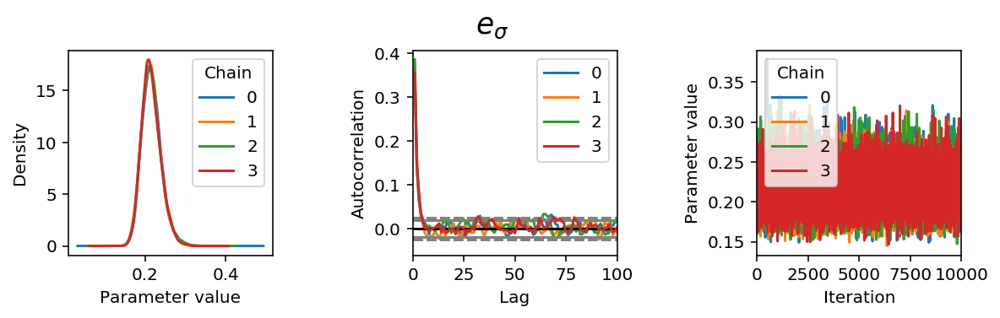

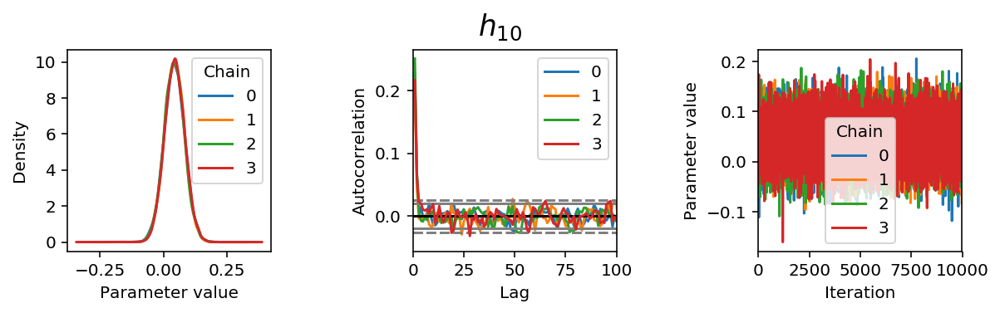

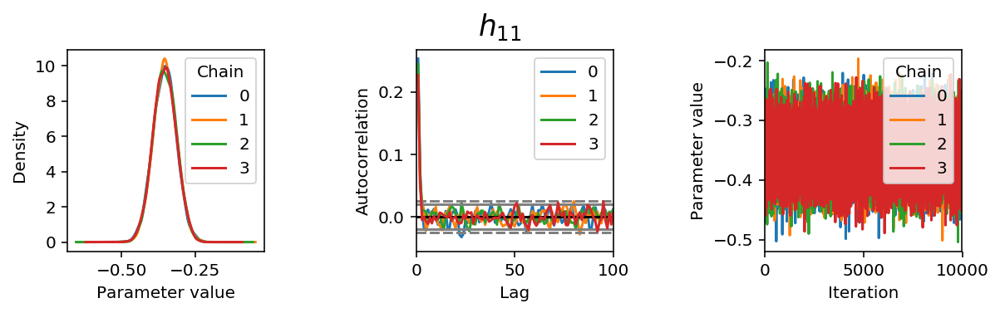

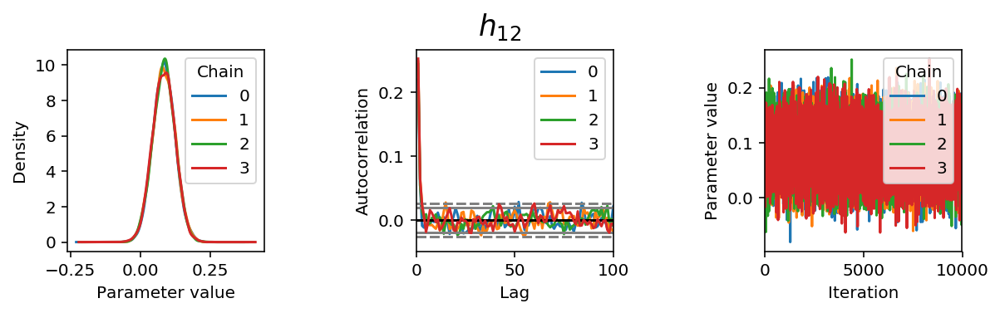

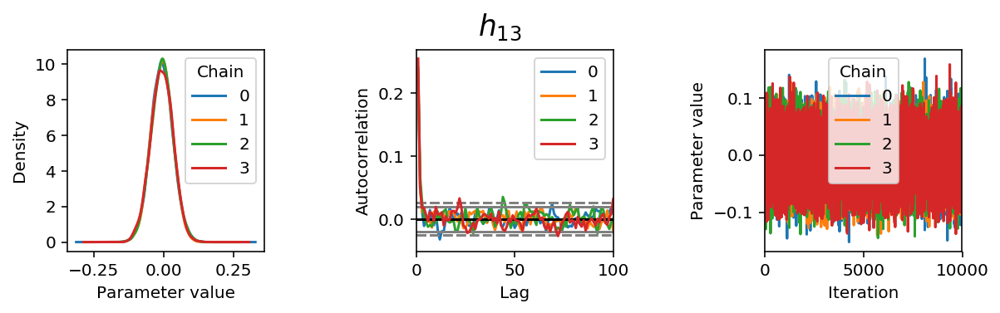

...

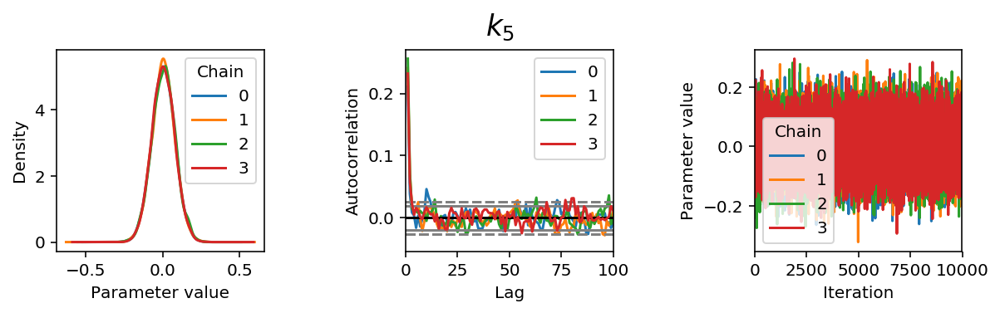

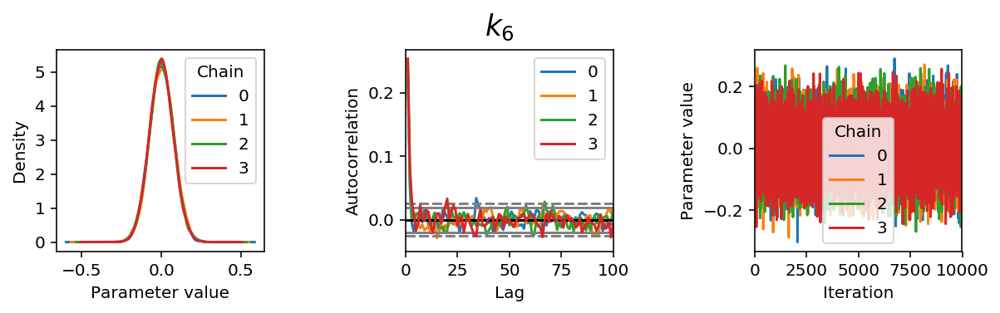

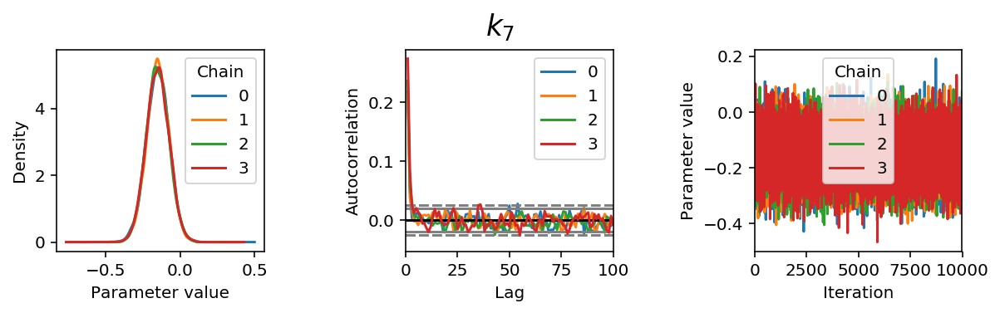

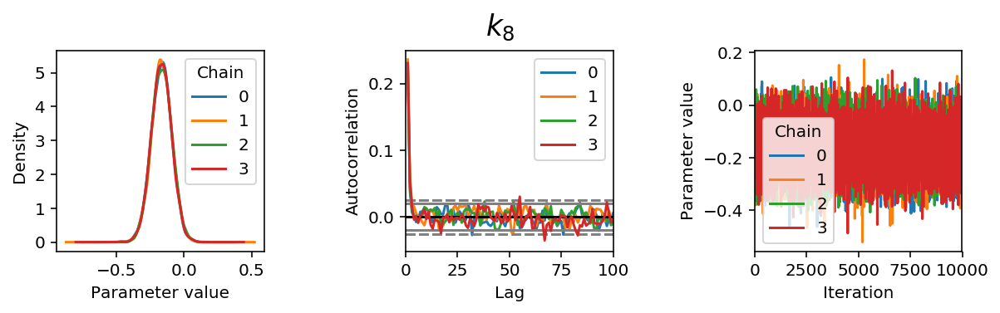

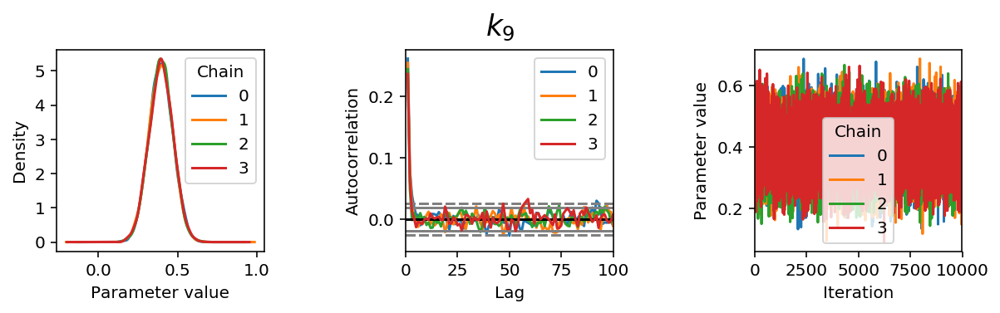

In [27]:
## Use pandas three dimensional Panel to represent the trace:

trace = pd.Panel({k: v for k, v in samples_Nm1.items()})
trace.axes[0].name = 'Variable'
trace.axes[1].name = 'Iteration'
trace.axes[2].name = 'Chain'
 
## Point estimates:
print(trace.to_frame().mean())
 
## Bayesian equal-tailed 95% credible intervals:
print(trace.to_frame().quantile([0.05, 0.95]))
  ## ^ entering the values here could be a good question part
    
def plot(trace, var):
    fig, axes = plt.subplots(1, 3, figsize=(9, 3))
    fig.suptitle(var, y=0.95, fontsize='xx-large')
 
    ## Marginal posterior density estimate:
    trace[var].plot.density(ax=axes[0])
    axes[0].set_xlabel('Parameter value')
    axes[0].locator_params(tight=True)
 
    ## Autocorrelation for each chain:
    axes[1].set_xlim(0, 100)
    for chain in trace[var].columns:
        autocorrelation_plot(trace[var,:,chain], axes[1], label=chain)
 
    ## Trace plot:
    axes[2].set_ylabel('Parameter value')
    trace[var].plot(ax=axes[2])
 
    ## Save figure
    filename = var.replace("\\", "") 
    filename = filename.replace("$", "") 
    filename = filename.replace("}", "") 
    filename = filename.replace("{", "") 
    plt.tight_layout(pad=3)
    fig.savefig('Nm1_JAGS_h_and_k_'+'{}.png'.format(filename))
 
# Display diagnostic plots
for var in trace:
    plot(trace, var)
 


6.0
$k_{21}$
$h_{21}$
$k_{1}$
$k_{11}$
$e_{\sigma}$
$h_{1}$
$h_{11}$


/home/griffin/anaconda/envs/dsfp_py27/lib/python2.7/site-packages/ipykernel_launcher.py:25: FutureWarning: 'pandas.tools.plotting.scatter_matrix' is deprecated, import 'pandas.plotting.scatter_matrix' instead.


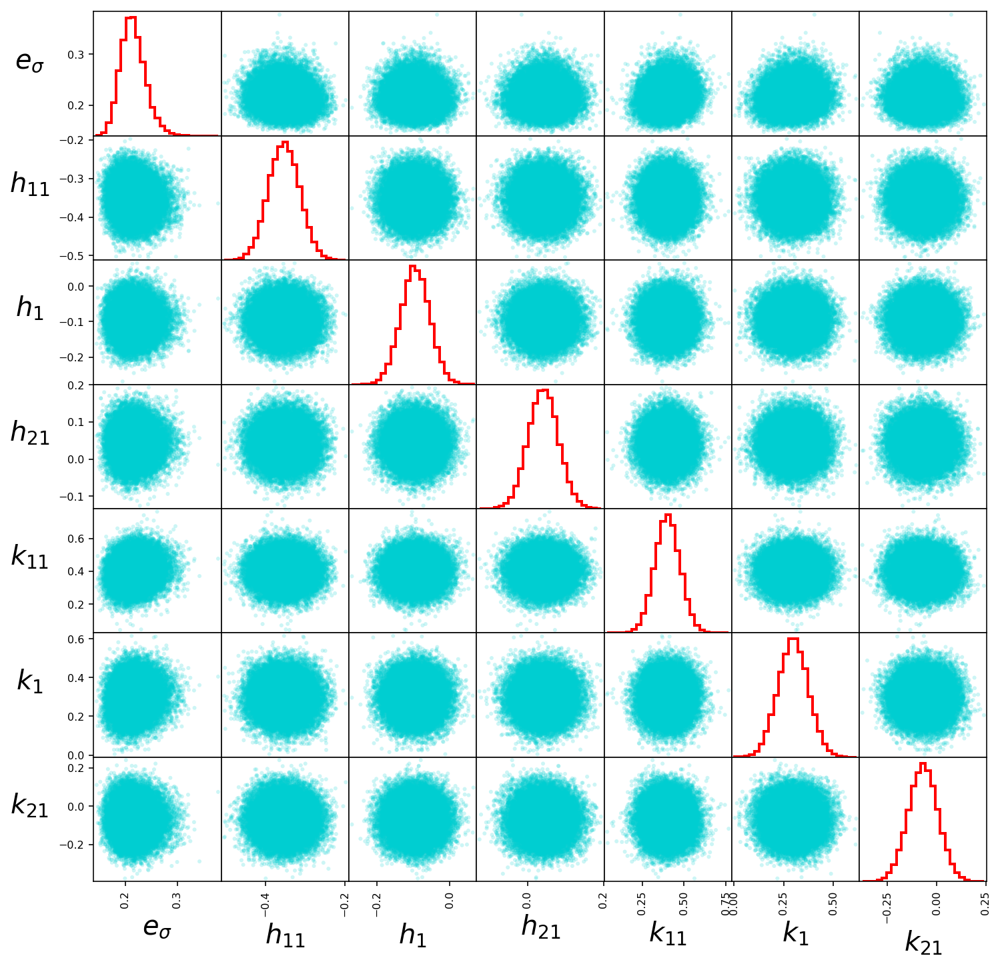

In [28]:
## Scatter matrix plot:

## Redefine the trace so that we only vizualize every 10th latent variable element in 
## the scatter_matrix plot below. Vizualizing all 50 is too cumbersome for the scatter
## matrix. 

samples_Nm1_for_scatter_matrix = {}
Nsamp=25
## adjust the thin varible to only look at every 10th population element by setting it to 10
thin = 10
numHyperParams = 1
dim = (Nsamp/thin)*2 + numHyperParams
print(dim)

for i in np.arange(0,Nsamp,thin):
    samples_Nm1_for_scatter_matrix.update({'$h_{'+str(i+1)+'}$': samples['h'][i,:,:], '$k_{'+str(i+1)+'}$': samples['k'][i,:,:]})
samples_Nm1_for_scatter_matrix.update({'$e_{\sigma}$': samples['e_sigma'].squeeze(0)})

for j, i in samples_Nm1_for_scatter_matrix.items():
    print(j)
#    print(i)

trace_2 = pd.Panel({k: v for k, v in samples_Nm1_for_scatter_matrix.items()})

sm = scatter_matrix(trace_2.to_frame(),  color="darkturquoise", alpha=0.2, figsize=(dim*2, dim*2), diagonal='hist',hist_kwds={'bins':25,'histtype':'step', 'edgecolor':'r','linewidth':2})
## y labels size
[plt.setp(item.yaxis.get_label(), 'size', 20) for item in sm.ravel()]
## x labels size 
[plt.setp(item.xaxis.get_label(), 'size', 20) for item in sm.ravel()]
## Change label rotation
## This is helpful for very long labels
#[s.xaxis.label.set_rotation(45) for s in sm.reshape(-1)]
[s.xaxis.label.set_rotation(0) for s in sm.reshape(-1)]
[s.yaxis.label.set_rotation(0) for s in sm.reshape(-1)]
## May need to offset label when rotating to prevent overlap of figure
[s.get_yaxis().set_label_coords(-0.5,0.5) for s in sm.reshape(-1)]
## Hide all ticks
#[s.set_xticks(()) for s in sm.reshape(-1)]
#[s.set_yticks(()) for s in sm.reshape(-1)]

plt.savefig('scatter_matrix_Nm1_JAGS.png')


<h3 align="left"> 2. Generalize to a two-component Gaussian Mixture Population Model </h3>

In [11]:
## Below we designate the population values of our two-component truncated Gaussian 
## generative model. These are the truths that we should recover if our hiararchical 
## Bayesian model is properly specified and diagnostics have indicated that the simulation 
## has "not not converged".
Ndata = 25
Nm = 2
frac = [0.7,0.3]
sigmae = [0.05,0.3]

## After generating values from the population model, we now add realistic Gaussian noise 
## to create simulated measurements. 
sigmahobs = 0.04
sigmakobs = 0.08

h = np.repeat(0.,Ndata)
k = np.repeat(0.,Ndata)
hhat = np.repeat(0.,Ndata)
khat = np.repeat(0.,Ndata)
hhat_sigma  = np.repeat(sigmahobs,Ndata)
khat_sigma  = np.repeat(sigmakobs,Ndata)

#print(khat_sigma)

for i in range(0,Ndata):
    #print('i')
    #print(i)
    
    c = np.random.choice(len(frac), 1, p=frac, replace=True)
    #print(int(c))
    h[i] = rnorm_bound(1,0,sigmae[int(c)],lower_bound=-1,upper_bound=1)
    # Euler's formula: h^2 + k^2 = 1
    lb = -np.sqrt(1-h[i]**2)
    ub = np.sqrt(1-h[i]**2)
    k[i] = rnorm_bound(1,0,sigmae[int(c)],lower_bound=lb,upper_bound=ub) 
    hhat[i] = rnorm_bound(1,h[i],sigmahobs,lower_bound=-1,upper_bound=1)
    khat[i] = rnorm_bound(1,k[i],sigmakobs,lower_bound=lb,upper_bound=ub)

    
print(h, hhat, k, khat)

[-0.10496727 -0.05231293 -0.26608483  0.02836922  0.03816306 -0.0726456
 -0.28222843 -0.07838048 -0.31356963 -0.01602208 -0.41120376  0.04309258
 -0.01801679 -0.16335052  0.49930221  0.0282694   0.47385146 -0.00837146
 -0.01983007  0.17804884  0.04034919 -0.010559   -0.02227961 -0.02340625
 -0.44970414] [ -9.82480213e-02  -8.51837517e-02  -3.01791017e-01   3.13876875e-02
   1.03819410e-01  -7.12183381e-02  -2.35722673e-01  -1.17969881e-01
  -3.83621357e-01   4.37554599e-02  -3.65674025e-01   8.63116252e-02
  -6.50554141e-03  -1.29956250e-01   4.63579191e-01   2.14581862e-02
   5.49755984e-01   3.65500891e-03   1.01918561e-02   1.98680837e-01
   4.32995058e-02  -3.49233622e-02   1.41248804e-04  -2.74424445e-02
  -4.64439122e-01] [ 0.35346884 -0.04021411 -0.27921161  0.04922887  0.03553182 -0.00061959
 -0.07723717 -0.14534984  0.39423004  0.02958892  0.42674899  0.0948883
  0.03744687  0.02360447 -0.01079184 -0.10851764  0.06506275  0.05081515
 -0.0698162  -0.16349376  0.01104341 -0.2560

In [12]:
# JAGS model code

code = '''

model {
        
    #Population parameters
    for (j in 1:Nm) {
        e_sigma[j] ~ dunif(0.0, 1.0)
        e_phi[j] <- 1/(e_sigma[j]*e_sigma[j])
        a[j] <- 1;
    }

    f ~ ddirch(a[])
        
    for (n in 1:Ndata){
    
        #True planet properties
        c[n] ~ dcat(f[]) 
        h[n] ~ dnorm(0, e_phi[c[n]]) T(-1,1) #Can try multivariate truncated normal in future
        k[n] ~ dnorm(0, e_phi[c[n]]) T(-sqrt(1-h[n]*h[n]),sqrt(1-h[n]*h[n]))
            
        #Observed planet properties
        hhat[n] ~ dnorm(h[n], 1.0/(hhat_sigma[n]*hhat_sigma[n])) T(-1,1)
        khat[n] ~ dnorm(k[n], 1.0/(khat_sigma[n]*khat_sigma[n])) T(-sqrt(1-hhat[n]*hhat[n]),sqrt(1-hhat[n]*hhat[n]))
    }
        
}
'''

In [14]:
# Load additional JAGS module
pyjags.load_module('glm')
pyjags.load_module('dic')

#data list include only variables in the model
model = pyjags.Model(code, data=dict(Nm=Nm, Ndata=Ndata, hhat=hhat, khat=khat, 
                                     hhat_sigma=hhat_sigma, khat_sigma=khat_sigma), 
                     chains=4, adapt=1000)
# threads=4, chains_per_thread=1 
# 500 warmup / burn-in iterations, not used for inference.
model.sample(500, vars=[])

## Run model for desired steps, monitoring hyperparameter variables.
## Returns a dictionary with numpy array for each monitored variable.
## Shapes of returned arrays are (... shape of variable ..., iterations, chains).
## 
iters = 100000
samples2 = model.sample(iters, vars=['e_sigma', 'h', 'k', 'c', 'f'])

# Pickle the data
#with open('ecc_1_test.pkl', 'wb') as handle:
#    pickle.dump(samples, handle)
    
# Retrieve pickled data
# with open('ecc_1_test.pkl', 'rb') as handle:
#      retrieved_results = pickle.load(handle)


adapting: iterations 4000 of 4000, elapsed 0:00:03, remaining 0:00:00
sampling: iterations 2000 of 2000, elapsed 0:00:02, remaining 0:00:00
sampling: iterations 11692 of 400000, elapsed 0:00:09, remaining 0:05:05
sampling: iterations 24428 of 400000, elapsed 0:00:19, remaining 0:04:58
sampling: iterations 30736 of 400000, elapsed 0:00:24, remaining 0:04:53
sampling: iterations 37036 of 400000, elapsed 0:00:29, remaining 0:04:49
sampling: iterations 43316 of 400000, elapsed 0:00:35, remaining 0:04:45
sampling: iterations 49576 of 400000, elapsed 0:00:40, remaining 0:04:41
sampling: iterations 55812 of 400000, elapsed 0:00:45, remaining 0:04:37
sampling: iterations 62024 of 400000, elapsed 0:00:50, remaining 0:04:34
sampling: iterations 68184 of 400000, elapsed 0:00:56, remaining 0:04:34
sampling: iterations 80312 of 400000, elapsed 0:01:07, remaining 0:04:26
sampling: iterations 86328 of 400000, elapsed 0:01:12, remaining 0:04:21
sampling: iterations 92344 of 400000, elapsed 0:01:17, re

Sort the high and low mixture components to accomidate the exchangeability of parameters

0.000577108814571


([array([   8.,   36.,  126.,  206.,  248.,  213.,  105.,   51.,    7.,    0.]),
  array([   6.,   22.,   72.,  156.,  253.,  250.,  177.,   53.,   11.,    0.]),
  array([   1.,   16.,   95.,  192.,  256.,  254.,  134.,   39.,    7.,    6.]),
  array([  11.,   73.,  177.,  246.,  221.,  155.,   96.,   19.,    2.,    0.])],
 array([ 0.01159741,  0.11037996,  0.20916251,  0.30794506,  0.4067276 ,
         0.50551015,  0.6042927 ,  0.70307525,  0.8018578 ,  0.90064034,
         0.99942289]),
 <a list of 4 Lists of Patches objects>)

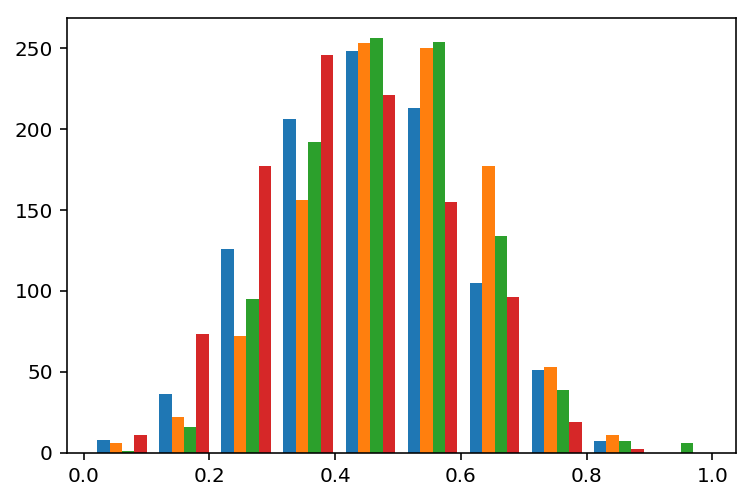

In [15]:
chain_thin = 100
start = int(iters-1000)
esigma_low = np.where(samples2['e_sigma'][0,start::,:] <= samples2['e_sigma'][1,start::,:], samples2['e_sigma'][0,start::,:], samples2['e_sigma'][1,start::,:])
esigma_hi = np.where(samples2['e_sigma'][0,start::,:] > samples2['e_sigma'][1,start::,:], samples2['e_sigma'][0,start::,:], samples2['e_sigma'][1,start::,:])
f_low = np.where(samples2['e_sigma'][0,start::,:] <= samples2['e_sigma'][1,start::,:], samples2['f'][0,start::,:], samples2['f'][1,start::,:])
f_hi = np.where(samples2['e_sigma'][0,start::,:] > samples2['e_sigma'][1,start::,:], samples2['f'][0,start::,:], samples2['f'][1,start::,:])
print(np.min(f_hi))
plt.hist(f_low)

In [19]:
iters = 100000

#print(samples)
#print(samples.items())

print(samples2['h'].shape)
print(samples2['k'][0,start::,:].shape)
print('-----')
samples_Nm2 = {}
Nsamp=25
thin = 1
numHyperParams = 4
dim = (Nsamp/thin)*2 + numHyperParams
print(dim)
for i in np.arange(0,Nsamp,thin):
    samples_Nm2.update({'$h_{'+str(i+1)+'}$': samples2['h'][i,start::,:], '$k_{'+str(i+1)+'}$': samples2['k'][i,start::,:]})
samples_Nm2.update({'$e_{\sigma_{low}}$': esigma_low, '$e_{\sigma_{high}}$': esigma_hi })
samples_Nm2.update({'$f_{low}$': f_low,'$f_{high}$': f_hi })

for j, i in samples_Nm2.items():
    print(j)
    #print(i)


(25, 100000, 4)
(1000, 4)
-----
54.0
$h_{2}$
$k_{6}$
$k_{17}$
$h_{3}$
$h_{14}$
$k_{16}$
$k_{14}$
$h_{15}$
$h_{17}$
$h_{5}$
$k_{24}$
$f_{low}$
$h_{18}$
$h_{19}$
$k_{11}$
$k_{22}$
$k_{7}$
$k_{9}$
$k_{23}$
$h_{16}$
$h_{24}$
$k_{4}$
$h_{10}$
$h_{1}$
$h_{11}$
$k_{20}$
$f_{high}$
$k_{5}$
$k_{15}$
$k_{18}$
$k_{21}$
$h_{21}$
$k_{8}$
$h_{12}$
$e_{\sigma_{low}}$
$h_{20}$
$h_{22}$
$k_{19}$
$h_{13}$
$h_{9}$
$k_{1}$
$k_{3}$
$k_{2}$
$h_{4}$
$k_{12}$
$h_{6}$
$k_{10}$
$h_{7}$
$e_{\sigma_{high}}$
$h_{25}$
$h_{8}$
$h_{23}$
$k_{25}$
$k_{13}$


In [20]:
## equal tailed 95% credible intervals, and posterior distribution means:
def summary(samples, varname, p=95):
    values = samples[varname][0]
    ci = np.percentile(values, [100-p, p])
    print('{:<6} mean = {:>5.1f}, {}% credible interval [{:>4.1f} {:>4.1f}]'.format(
      varname, np.mean(values), p, *ci))

for varname in samples_Nm2:
    summary(samples_Nm2, varname)


$h_{2}$ mean =  -0.1, 95% credible interval [-0.1 -0.0]
$k_{6}$ mean =   0.0, 95% credible interval [-0.0  0.1]
$k_{17}$ mean =   0.1, 95% credible interval [ 0.1  0.2]
$h_{3}$ mean =  -0.3, 95% credible interval [-0.3 -0.3]
$h_{14}$ mean =  -0.1, 95% credible interval [-0.2 -0.1]
$k_{16}$ mean =  -0.1, 95% credible interval [-0.1 -0.0]
$k_{14}$ mean =  -0.1, 95% credible interval [-0.2 -0.1]
$h_{15}$ mean =   0.4, 95% credible interval [ 0.3  0.5]
$h_{17}$ mean =   0.5, 95% credible interval [ 0.5  0.6]
$h_{5}$ mean =   0.1, 95% credible interval [ 0.1  0.1]
$k_{24}$ mean =   0.0, 95% credible interval [-0.0  0.0]
$f_{low}$ mean =   0.5, 95% credible interval [ 0.5  0.6]
$h_{18}$ mean =   0.0, 95% credible interval [-0.1  0.1]
$h_{19}$ mean =   0.0, 95% credible interval [-0.1  0.1]
$k_{11}$ mean =   0.4, 95% credible interval [ 0.3  0.5]
$k_{22}$ mean =  -0.1, 95% credible interval [-0.2 -0.1]
$k_{7}$ mean =  -0.2, 95% credible interval [-0.2 -0.1]
$k_{9}$ mean =   0.4, 95% credible 

Variable
$e_{\sigma_{high}}$    0.305262
$e_{\sigma_{low}}$     0.052891
$f_{high}$             0.537613
$f_{low}$              0.462387
$h_{10}$               0.025783
$h_{11}$              -0.357993
$h_{12}$               0.057132
$h_{13}$              -0.003833
$h_{14}$              -0.117371
$h_{15}$               0.454737
$h_{16}$               0.013724
$h_{17}$               0.538140
$h_{18}$               0.000336
$h_{19}$               0.006838
$h_{1}$               -0.095434
$h_{20}$               0.191670
$h_{21}$               0.027318
$h_{22}$              -0.025945
$h_{23}$               0.000246
$h_{24}$              -0.014929
$h_{25}$              -0.455879
$h_{2}$               -0.057694
$h_{3}$               -0.296784
$h_{4}$                0.027576
$h_{5}$                0.070990
$h_{6}$               -0.044362
$h_{7}$               -0.228020
$h_{8}$               -0.106505
$h_{9}$               -0.375625
$k_{10}$              -0.003495
$k_{11}$               0.425377

/home/griffin/anaconda/envs/dsfp_py27/lib/python2.7/site-packages/ipykernel_launcher.py:27: FutureWarning: 'pandas.tools.plotting.autocorrelation_plot' is deprecated, import 'pandas.plotting.autocorrelation_plot' instead.


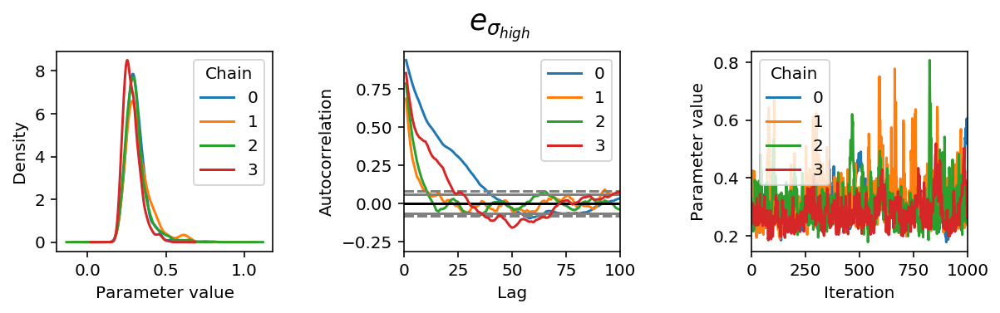

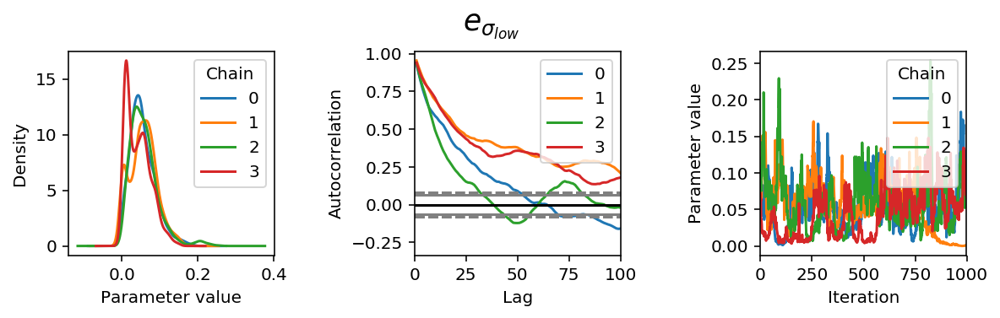

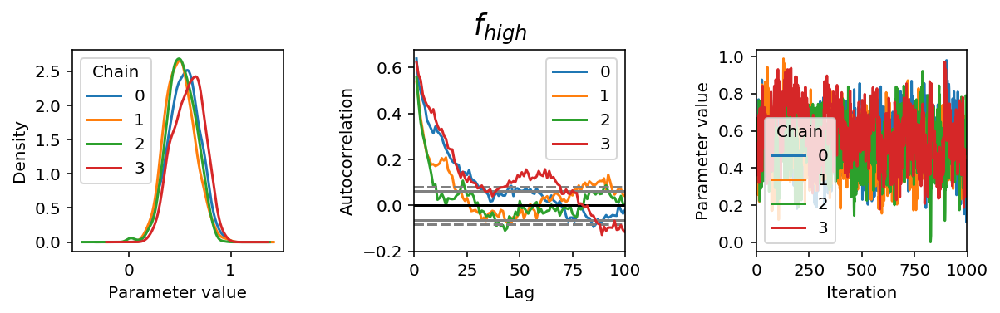

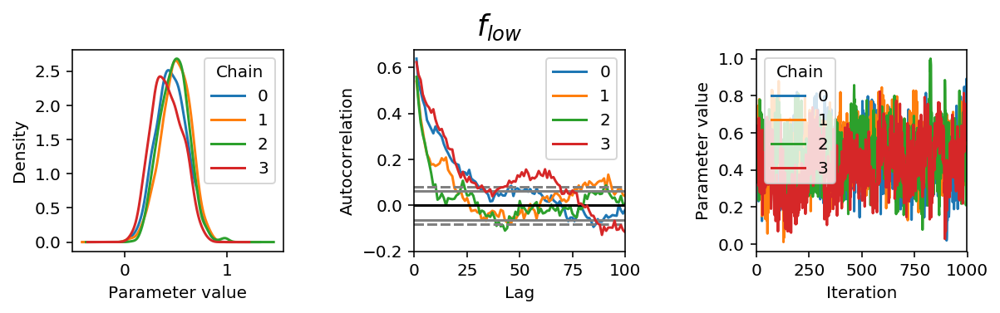

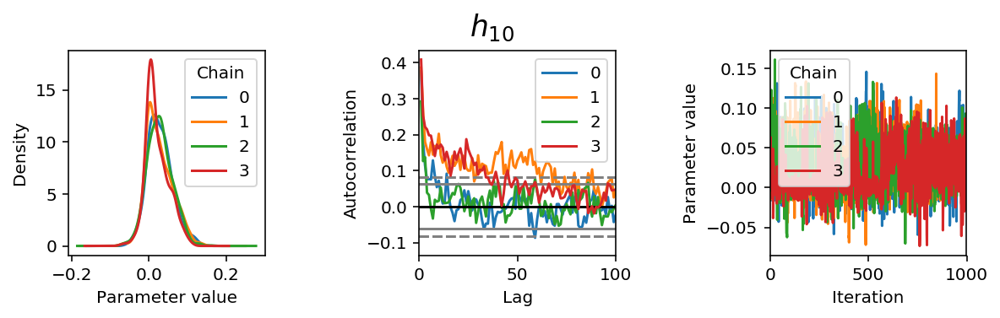

...

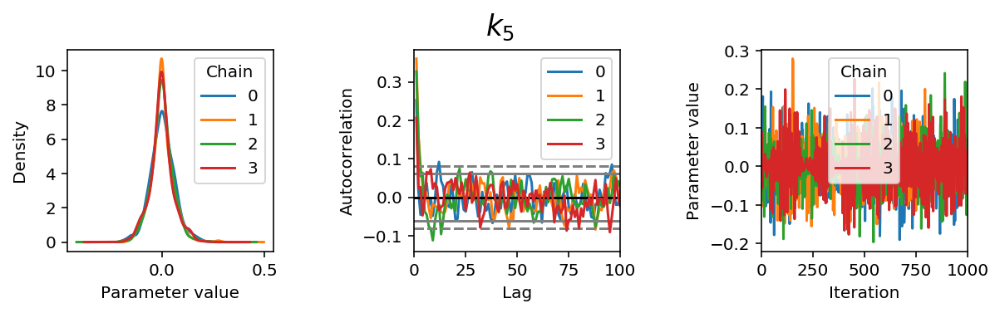

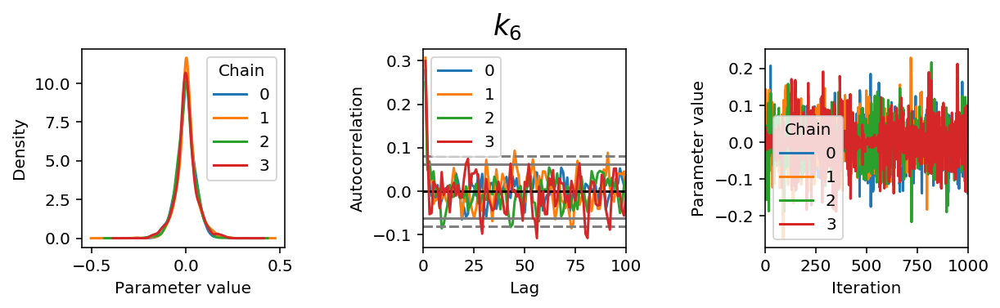

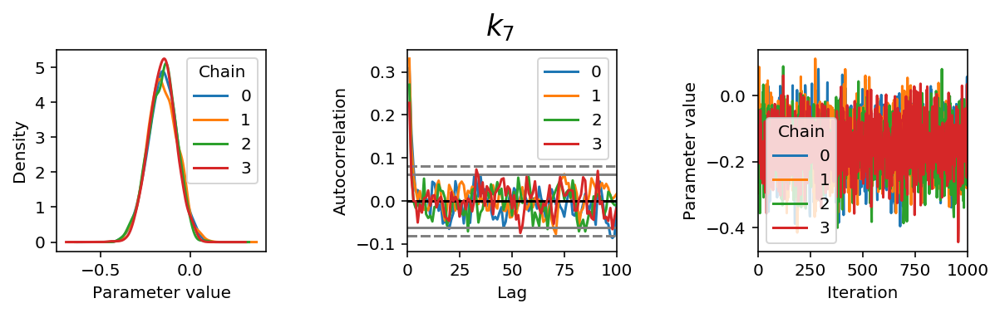

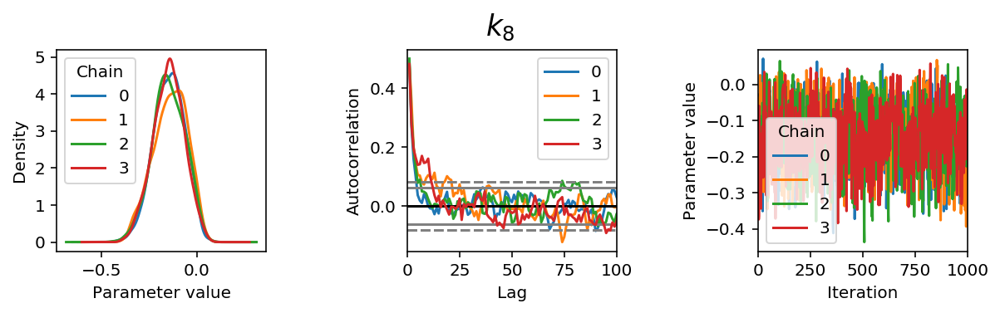

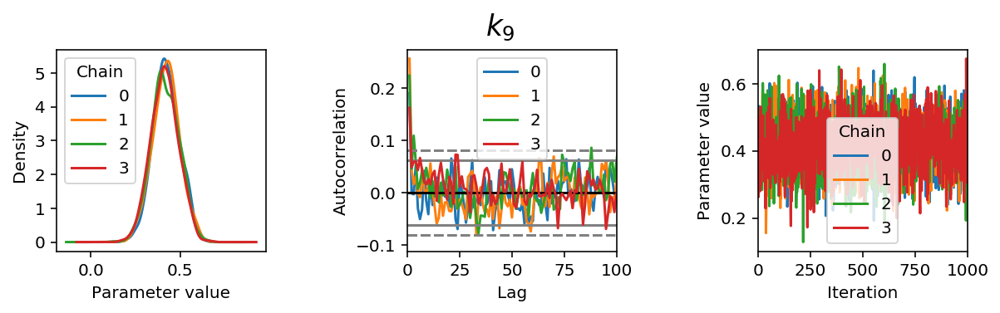

In [21]:
## Use pandas three dimensional Panel to represent the trace:

trace = pd.Panel({k: v for k, v in samples_Nm2.items()})
trace.axes[0].name = 'Variable'
trace.axes[1].name = 'Iteration'
trace.axes[2].name = 'Chain'
 
## Point estimates:
print(trace.to_frame().mean())
 
## Bayesian equal-tailed 95% credible intervals:
print(trace.to_frame().quantile([0.05, 0.95]))
  ## ^ entering the values here could be a good question part
    
def plot(trace, var):
    fig, axes = plt.subplots(1, 3, figsize=(9, 3))
    fig.suptitle(var, y=0.95, fontsize='xx-large')
 
    ## Marginal posterior density estimate:
    trace[var].plot.density(ax=axes[0])
    axes[0].set_xlabel('Parameter value')
    axes[0].locator_params(tight=True)
 
    ## Autocorrelation for each chain:
    axes[1].set_xlim(0, 100)
    for chain in trace[var].columns:
        autocorrelation_plot(trace[var,:,chain], axes[1], label=chain)
 
    ## Trace plot:
    axes[2].set_ylabel('Parameter value')
    trace[var].plot(ax=axes[2])
 
    ## Save figure
    filename = var.replace("\\", "") 
    filename = filename.replace("/", "") 
    filename = filename.replace("$", "") 
    filename = filename.replace("}", "") 
    filename = filename.replace("{", "") 
    plt.tight_layout(pad=3)
    fig.savefig('Nm2_JAGS_'+'{}.png'.format(filename))

    
## Display diagnostic plots
for var in trace:
    plot(trace, var)
 


In [22]:
## Scatter matrix plot:

## Redefine the trace so that we only vizualize every 10th latent variable element in 
## the scatter_matrix plot below. Vizualizing all 50 is too cumbersome for the scatter
## matrix. 

samples_Nm2_for_scatter_matrix = {}

## adjust the thin varible to only look at every 10th population element by setting it to 10
thin = 10
numHyperParams = 4
dim = (Ndata/thin)*2 + numHyperParams
print(dim)

for i in np.arange(0,Ndata,thin):
    samples_Nm2_for_scatter_matrix.update({'$h_{'+str(i+1)+'}$': samples2['h'][i,start::,:], '$k_{'+str(i+1)+'}$': samples2['k'][i,start::,:]})
samples_Nm2_for_scatter_matrix.update({'$e_{\sigma_{low}}$': esigma_low, '$e_{\sigma_{high}}$': esigma_hi })
samples_Nm2_for_scatter_matrix.update({'$f_{low}$': f_low,'$f_{high}$': f_hi })

for j, i in samples_Nm2_for_scatter_matrix.items():
    print(j)
#    print(i)

trace_3 = pd.Panel({k: v for k, v in samples_Nm2_for_scatter_matrix.items()})

sm = scatter_matrix(trace_3.to_frame(),  color="darkturquoise", alpha=0.2, figsize=(dim*2, dim*2), diagonal='hist',hist_kwds={'bins':25,'histtype':'step', 'edgecolor':'r','linewidth':2})
## y labels size
[plt.setp(item.yaxis.get_label(), 'size', 20) for item in sm.ravel()]
## x labels size 
[plt.setp(item.xaxis.get_label(), 'size', 20) for item in sm.ravel()]
## Change label rotation
## This is helpful for very long labels
#[s.xaxis.label.set_rotation(45) for s in sm.reshape(-1)]
[s.xaxis.label.set_rotation(0) for s in sm.reshape(-1)]
[s.yaxis.label.set_rotation(0) for s in sm.reshape(-1)]
## May need to offset label when rotating to prevent overlap of figure
[s.get_yaxis().set_label_coords(-0.5,0.5) for s in sm.reshape(-1)]
## Hide all ticks
#[s.set_xticks(()) for s in sm.reshape(-1)]
#[s.set_yticks(()) for s in sm.reshape(-1)]

plt.savefig('scatter_matrix_Nm2_JAGS.png')


9.0
$k_{21}$
$h_{21}$
$e_{\sigma_{low}}$
$k_{1}$
$f_{high}$
$k_{11}$
$f_{low}$
$h_{1}$
$e_{\sigma_{high}}$
$h_{11}$


/home/griffin/anaconda/envs/dsfp_py27/lib/python2.7/site-packages/ipykernel_launcher.py:26: FutureWarning: 'pandas.tools.plotting.scatter_matrix' is deprecated, import 'pandas.plotting.scatter_matrix' instead.
IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.
